# UNSW-NB 15 Dataset ML Methods Comparison Notebook - Attack or Normal Response

This notebook would implement several modified (Explainable AI (XAI)) machine learning methods:

- Decision Trees
- Neural Networks: we will use Multi-layer perceptron.
- XGBoost

We will illustrate them and compare their performances using the raw network packets of the UNSW-NB 15 dataset was created by the IXIA PerfectStorm tool in the Cyber Range Lab of the Australian Centre for Cyber Security (ACCS) for generating a hybrid of real modern normal activities and synthetic contemporary attack behaviours. Further information found at https://www.kaggle.com/mrwellsdavid/unsw-nb15


![unsw-nb15-testbed.jpg](attachment:unsw-nb15-testbed.jpg)









Tcpdump tool is utilised to capture 100 GB of the raw traffic (e.g., Pcap files). This dataset has nine types of attacks, namely, Fuzzers, Analysis, Backdoors, DoS, Exploits, Generic, Reconnaissance, Shellcode and Worms. The Argus, Bro-IDS tools are used and twelve algorithms are developed to generate totally 49 features with the class label.

These features are described in UNSW-NB15_features.csv file.

A partition from this dataset is configured as a training set and testing set, namely, UNSW_NB15_training-set.csv and UNSW_NB15_testing-set.csv respectively.

The number of records in the training set is 175,341 records and the testing set is 82,332 records from the different types, attack and normal.Figure 1 and 2 show the testbed configuration dataset and the method of the feature creation of the UNSW-NB15, respectively.

The details of the UNSW-NB15 dataset are published in following the papers:

Moustafa, Nour, and Jill Slay. "UNSW-NB15: a comprehensive data set for network intrusion detection systems (UNSW-NB15 network data set)." Military Communications and Information Systems Conference (MilCIS), 2015. IEEE, 2015.
Moustafa, Nour, and Jill Slay. "The evaluation of Network Anomaly Detection Systems: Statistical analysis of the UNSW-NB15 dataset and the comparison with the KDD99 dataset." Information Security Journal: A Global Perspective (2016): 1-14.
Moustafa, Nour, et al. . "Novel geometric area analysis technique for anomaly detection using trapezoidal area estimation on large-scale networks." IEEE Transactions on Big Data (2017).
Moustafa, Nour, et al. "Big data analytics for intrusion detection system: statistical decision-making using finite dirichlet mixture models." Data Analytics and Decision Support for Cybersecurity. Springer, Cham, 2017. 127-156.

Free use of the UNSW-NB15 dataset for academic research purposes is hereby granted in perpetuity. Use for commercial purposes should be agreed by the authors. Nour Moustafa and Jill Slay have asserted their rights under the Copyright. To whom intend the use of the UNSW-NB15 dataset have to cite the above two papers.


For more information, please contact the authors: Harshil Patel & Yuesheng Chen are a students in Industrial Engineering at Ohio State University, and they are interested in new Cyber threat intelligence approaches and the technology of Industry 4.0.

In this notebook, the operations conducted include:

- Preprocessing the data to prepare for training XAI ML models.
- Training XAI ML models based on cross-validation.
- Evaluating XAI ML models based on testing data.

# Libraries

Import libararies to implement the described machine learning methods using a few different `sklearn` algorithms.

In [ ]:
# data cleaning and plots
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

# sklearn: data preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder

# sklearn: train model
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_validate, StratifiedKFold
from sklearn.metrics import precision_recall_curve, precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score, confusion_matrix, classification_report

# sklearn classifiers

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

from sklearn import datasets, ensemble, model_selection
from sklearn.ensemble import RandomForestClassifier

from sklearn.neural_network import MLPClassifier

# Data Processing

## Load Data

**UNSW-NB15: a comprehensive data set for network intrusion detection systems**

These features are described in UNSW-NB15_features.csv file.

A partition from this dataset is configured as a training set and testing set, namely, UNSW_NB15_training-set.csv and UNSW_NB15_testing-set.csv respectively.

The number of records in the training set is 175,341 records and the testing set is 82,332 records from the different types, attack and normal.Figure 1 and 2 show the testbed configuration dataset and the method of the feature creation of the UNSW-NB15, respectively. The addtional features are as described in UNSW-NB15_features.csv file.

Response Variable:

attack_cat: This dataset has nine types of attacks, namely, Fuzzers, Analysis, Backdoors, DoS, Exploits, Generic, Reconnaissance, Shellcode and Worms.

Label: 0 for normal and 1 for attack records


In [ ]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Load data
initial_data = pd.read_csv('/content/drive/MyDrive/UNSW_NB15_training.csv')

In [ ]:
# Look at the first 5 rows
initial_data.head(n=5)

,dur,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,0.000011,2,0,496,0,90909.0902,254,0,180363632.0,0.0,...,1,2,0,0,0,1,2,0,Normal,0
1,0.000008,2,0,1762,0,125000.0003,254,0,881000000.0,0.0,...,1,2,0,0,0,1,2,0,Normal,0
2,0.000005,2,0,1068,0,200000.0051,254,0,854400000.0,0.0,...,1,3,0,0,0,1,3,0,Normal,0
3,0.000006,2,0,900,0,166666.6608,254,0,600000000.0,0.0,...,1,3,0,0,0,2,3,0,Normal,0
4,0.000010,2,0,2126,0,100000.0025,254,0,850400000.0,0.0,...,1,3,0,0,0,2,3,0,Normal,0


In [ ]:
# information of the data: 583 data points, 10 features' columns and 1 target column
initial_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82332 entries, 0 to 82331
Data columns (total 41 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   dur                82332 non-null  float64
 1   spkts              82332 non-null  int64  
 2   dpkts              82332 non-null  int64  
 3   sbytes             82332 non-null  int64  
 4   dbytes             82332 non-null  int64  
 5   rate               82332 non-null  float64
 6   sttl               82332 non-null  int64  
 7   dttl               82332 non-null  int64  
 8   sload              82332 non-null  float64
 9   dload              82332 non-null  float64
 10  sloss              82332 non-null  int64  
 11  dloss              82332 non-null  int64  
 12  sinpkt             82332 non-null  float64
 13  dinpkt             82332 non-null  float64
 14  sjit               82332 non-null  float64
 15  djit               82332 non-null  float64
 16  swin               823

## Tidy Data

### Check missing values
First, we should check if there are missing values in the dataset. We could see that four patients do not have the value of `Albumin_and_Globulin_Ratio`.

In [ ]:
# check if there are Null values
initial_data.isnull().sum()

dur                  0
spkts                0
dpkts                0
sbytes               0
dbytes               0
rate                 0
sttl                 0
dttl                 0
sload                0
dload                0
sloss                0
dloss                0
sinpkt               0
dinpkt               0
sjit                 0
djit                 0
swin                 0
stcpb                0
dtcpb                0
dwin                 0
tcprtt               0
synack               0
ackdat               0
smean                0
dmean                0
trans_depth          0
response_body_len    0
ct_srv_src           0
ct_state_ttl         0
ct_dst_ltm           0
ct_src_dport_ltm     0
ct_dst_sport_ltm     0
ct_dst_src_ltm       0
is_ftp_login         0
ct_ftp_cmd           0
ct_flw_http_mthd     0
ct_src_ltm           0
ct_srv_dst           0
is_sm_ips_ports      0
attack_cat           0
label                0
dtype: int64

A basic strategy to use incomplete datasets is to discard entire rows and/or columns containing missing values. Actually, there exists some strategies to impute missing values (see [here](https://scikit-learn.org/stable/modules/impute.html)). For simplicity, we will discard the four rows with missing values.

In [ ]:
# Discard the rows with missing values
data_to_use = initial_data.dropna()

# Shape of the data: we could see that the number of rows remains the same as no null values were reported
data_to_use.shape

(82332, 41)

### Check imbalanced issue on y

First, we get the `X` and `y1` and `y2` .

In [ ]:
X = data_to_use.drop(axis=1, columns=['attack_cat']) # X is a dataframe
X = X.drop(axis=1, columns=['label'])


y1 = data_to_use['attack_cat'].values # y is an array
y2 = data_to_use['label'].values

In [ ]:
# Calculate Y2 ratio
def data_ratio(y2):
    '''
    Calculate Y2's ratio
    '''
    unique, count = np.unique(y2, return_counts=True)
    ratio = round(count[0]/count[1], 1)
    return f'{ratio}:1 ({count[0]}/{count[1]})'

In [ ]:
# print('The class ratio for the original data:', data_ratio(y1))
# plt.figure(figsize=(13,5))
# print(y1)
# sns.countplot(float(y1))
# plt.show()

# print('The class ratio for the original data:', data_ratio(y2))
# sns.countplot(y2,label="Sum")
# plt.show()

We could see that the dataset is not perfectly balanced. There are some sampling techniques to deal with this issue. Here, we ignore this issue because we are aimed to implement several ML models to compare their performance.

### Split training and testing data

It is important to split `X` and `y` as training set and testing set. Here, we will split the original data as 70% training set and 30% testing set. But the partition action from this dataset was pre configured as a training set and testing set, namely, UNSW_NB15_training-set.csv and UNSW_NB15_testing-set.csv respectively.

The number of records in the TESTING set is 175,341 records and the TRAINING set is 82,332 records from the different types, attack and normal. Figure above shows the testbed configuration dataset and the method of the feature creation of the UNSW-NB15, respectively.

Thus the follwing code will not be utilized

In [ ]:
X_train, X_test, y1_train, y1_test, y2_train, y2_test = train_test_split(X, y1, y2, test_size=0.3, random_state=1)


In [ ]:
#print('The class ratio in training data: ', data_ratio(y_train))
#print('The class ratio in testing data: ', data_ratio(y_test))

In [ ]:
# # Load data
# test_data = pd.read_csv('UNSW_NB15_testing-set.csv')
# X_test = test_data.drop(axis=1, columns=['attack_cat']) # X_test is a dataframe
# X_test = X_test.drop(axis=1, columns=['label'])
# print(X_test)

# y1_test = test_data['attack_cat'].values # y is an array
# y2_test = test_data['label'].values

We will convert the orginal training data to the datframes called X_train, y1_train, y2_train

In [ ]:
# X_train = X
# y1_train = y1
# y2_train = y2

### Transform training and testing data

#### Transformation on X_train, X_test

Scikit-learn provides a library of transformers. Like other estimators, these are represented by classes with a `fit` method, which learns model parameters (e.g. mean and standard deviation for normalization) from a training set, and a `transform` method which applies this transformation model to unseen data.

**NOTE: The reason of performing transformation after splitting the original data is that we will `fit` those parameters on training set**.

In addition, it is very common to want to perform different data transformation techniques on different columns in your input data. The `ColumnTransformer` is a class in the scikit-learn library that allows you to selectively apply data preparation transforms. For example, it allows you to apply a specific transform or sequence of transforms to just the numerical columns, and a separate sequence of transforms to just the categorical columns.

In our case, we need to perform `OneHotEncoder` on `Gender` column because it is categorical, and perform `StandardScaler` on other numerical columns.

- `OneHotEncoder`: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html
- `StandardScaler`: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html

First, we find out which columns are categorical and which are numerical.

In [ ]:
# determine categorical and numerical columns
numerical_cols = X_train.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X_train.select_dtypes(include=['object', 'bool']).columns

In [ ]:
numerical_cols

Index(['dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sttl', 'dttl',
       'sload', 'dload', 'sloss', 'dloss', 'sinpkt', 'dinpkt', 'sjit', 'djit',
       'swin', 'stcpb', 'dtcpb', 'dwin', 'tcprtt', 'synack', 'ackdat', 'smean',
       'dmean', 'trans_depth', 'response_body_len', 'ct_srv_src',
       'ct_state_ttl', 'ct_dst_ltm', 'ct_src_dport_ltm', 'ct_dst_sport_ltm',
       'ct_dst_src_ltm', 'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd',
       'ct_src_ltm', 'ct_srv_dst', 'is_sm_ips_ports'],
      dtype='object')

In [ ]:
categorical_cols

Index([], dtype='object')

Then, we construct the `ColumnTransformer` object, and then fit it on training data.

In [ ]:
# define the transformation methods for the columns
t = [('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_cols),
    ('scale', StandardScaler(), numerical_cols)]

## Since New categories are found in the Test Data we remove drop='first' from OHE and use handle_unknown='ignore'

col_trans = ColumnTransformer(transformers=t)

# fit the transformation on training data
col_trans.fit(X_train)

ColumnTransformer(transformers=[('ohe', OneHotEncoder(handle_unknown='ignore'),
                                 Index([], dtype='object')),
                                ('scale', StandardScaler(),
                                 Index(['dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sttl', 'dttl',
       'sload', 'dload', 'sloss', 'dloss', 'sinpkt', 'dinpkt', 'sjit', 'djit',
       'swin', 'stcpb', 'dtcpb', 'dwin', 'tcprtt', 'synack', 'ackdat', 'smean',
       'dmean', 'trans_depth', 'response_body_len', 'ct_srv_src',
       'ct_state_ttl', 'ct_dst_ltm', 'ct_src_dport_ltm', 'ct_dst_sport_ltm',
       'ct_dst_src_ltm', 'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd',
       'ct_src_ltm', 'ct_srv_dst', 'is_sm_ips_ports'],
      dtype='object'))])

In [ ]:
X_train_transform = col_trans.transform(X_train)


In [ ]:
X_test_transform = col_trans.transform(X_test)


We could look at the transformed training data. It becomes an array-like structure rather than a dataframe structure.

In [ ]:
# look at the transformed training data
X_train_transform.shape

(57632, 39)

In [ ]:
X_test_transform.shape

(24700, 39)

#### Transformation on y_train and y_test

`LabelEncoder` is a utility class to help normalize labels such that they contain only values between 0 and n_classes-1. Note that the distinct values/labels in `y` target are 1 ( no liver disease) and 2 (liver disease). In our case, we will transform the label 1 and 2 as 0 and 1, respectively. New label 0 refers to no disease and 1 refers to liver disease. Although it should be much easier to achieve this by subtracting 1 from the `y` array, we provide the `LabelEncoder` transformation which is a standard way of dealing with targeted values. Again, similar to the transformation on `X`, we will apply `fit` method to `y_train` and then apply `transform` method to both `y_train` and `y_test`.  

In [ ]:
# Note that the distinct values/labels in `y2` target are 1 and 2.
pd.unique(y1)

array(['Normal', 'Reconnaissance', 'Backdoor', 'DoS', 'Exploits',
       'Analysis', 'Fuzzers', 'Worms', 'Shellcode', 'Generic'],
      dtype=object)

In [ ]:
pd.unique(y2)

array([0, 1])

In [ ]:
# Define a LabelEncoder() transformation method and fit on y1_train
target_trans = LabelEncoder()
target_trans.fit(y1_train)

LabelEncoder()

In [ ]:
# apply transformation method on y1_train and y1_test
y1_train_transform = target_trans.transform(y1_train)
y1_test_transform = target_trans.transform(y1_test)

In [ ]:
# view the transformed y1_train
y1_train_transform

array([4, 6, 3, ..., 0, 7, 6])

In [ ]:
# Define a LabelEncoder() transformation method and fit on y2_train
target_trans = LabelEncoder()
target_trans.fit(y2_train)
y2_train_transform = target_trans.transform(y2_train)
y2_test_transform = target_trans.transform(y2_test)

In [ ]:
# view the transformed y2_train
y2_train_transform

array([1, 0, 1, ..., 1, 1, 0])

# Train Modified (Explainable AI (XAI)) ML Models

We will train several XAI machine learning models for the training set and evaluate their performance on both training and testing set. XAI VISULATION WILL BE CREATED ALSO

## Steps of Training Model and Testing Model Performance with Testing Data

- Step 1: Train a XAI ML model and validate it via 5-fold cross-validation (CV). The CV results will show how good the model has been trained by using the training data given a set of hyperparameters in the ML model. The metrics of evaluating a model include accuracy, precision, recall, F1 score, AUC value of ROC.


- Step 2: Evaluate the model by using the testing data. It will show how good the model could be used to make predictions for unseen data.

**NOTE: For simplicity, we do not tune hyperparameters in the ML model and will use the default settings of hyperparameters in each ML model.**

**Let's firstly train a `Decision Tree Classifier` model with regards to Step 1 and Step 2.** using `y2` as the response feature FOR ALL THE XAI ML MODELS

## Explainable AI (XAI) with a Decision Tree Classifier

In [ ]:
# model and fit
DTclf = tree.DecisionTreeClassifier()
DTclf.fit(X_train_transform, y2_train_transform)

DecisionTreeClassifier()

In [ ]:
feature_names = np.array(numerical_cols)
feature_names

array(['dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sttl',
       'dttl', 'sload', 'dload', 'sloss', 'dloss', 'sinpkt', 'dinpkt',
       'sjit', 'djit', 'swin', 'stcpb', 'dtcpb', 'dwin', 'tcprtt',
       'synack', 'ackdat', 'smean', 'dmean', 'trans_depth',
       'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm',
       'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_src_ltm',
       'ct_srv_dst', 'is_sm_ips_ports'], dtype=object)

### Feature importance:

Feature importance is calculated as the decrease in node impurity weighted by the probability of reaching that node. The most important features will be higher in the tree. A single feature can be used in different branches of the tree, feature importance then is its total contribution in reducing the impurity.

39
['dur' 'spkts' 'dpkts' 'sbytes' 'dbytes' 'rate' 'sttl' 'dttl' 'sload'
 'dload' 'sloss' 'dloss' 'sinpkt' 'dinpkt' 'sjit' 'djit' 'swin' 'stcpb'
 'dtcpb' 'dwin' 'tcprtt' 'synack' 'ackdat' 'smean' 'dmean' 'trans_depth'
 'response_body_len' 'ct_srv_src' 'ct_state_ttl' 'ct_dst_ltm'
 'ct_src_dport_ltm' 'ct_dst_sport_ltm' 'ct_dst_src_ltm' 'is_ftp_login'
 'ct_ftp_cmd' 'ct_flw_http_mthd' 'ct_src_ltm' 'ct_srv_dst'
 'is_sm_ips_ports']
[19 38 16 33  7 34 28 11 35 25  1 15 13 14 31  2 12 10 26 20 17 18 36 22
 24 30  9  8  0 29 27 37  5  3  4 23 21 32  6]


Text(0.5, 0, 'Relative Importance')

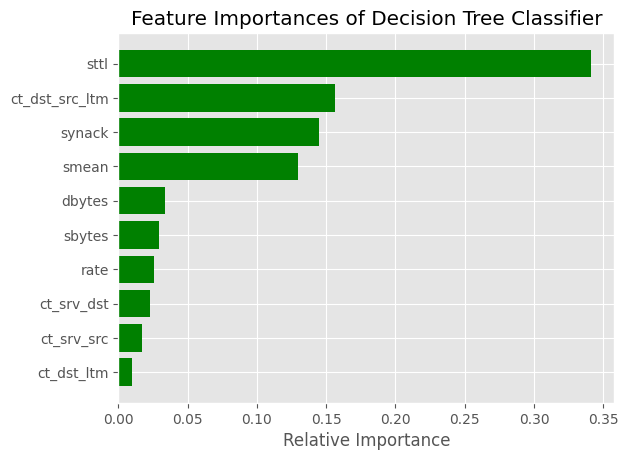

In [ ]:
importances = DTclf.feature_importances_
indices = np.argsort(importances)
features = np.array(numerical_cols)

print(len(features))
print(features)
print(indices)
plt.title('Feature Importances of Decision Tree Classifier')
count = 10 # top # importance
plt.barh(range(count), importances[indices][len(indices)-count:], color='g', align='center')
plt.yticks(range(count), [features[i] for i in indices[len(indices)-count:]])

# WHAT TO SHOW ON Y-AXIS IF OHE APPLIED as now |features| < |Columns|

plt.xlabel('Relative Importance')
# plt.show()

In [ ]:
DTclf.feature_importances_

array([8.64446177e-03, 1.63758961e-03, 3.41396506e-03, 2.90569824e-02,
       3.34845681e-02, 2.55102174e-02, 3.41092752e-01, 6.70849024e-05,
       7.48119705e-03, 7.05558111e-03, 3.74618373e-03, 1.31883213e-03,
       3.43090621e-03, 3.26485066e-03, 3.30486943e-03, 3.16222310e-03,
       4.67161298e-05, 4.18745205e-03, 4.67368123e-03, 0.00000000e+00,
       3.96955494e-03, 1.44581970e-01, 4.96641320e-03, 1.29602529e-01,
       5.07050940e-03, 1.62356863e-03, 3.96342214e-03, 1.66281890e-02,
       3.17695056e-04, 9.67685836e-03, 5.96324704e-03, 3.39470474e-03,
       1.56423133e-01, 5.95357479e-05, 1.37979426e-04, 1.47078567e-03,
       4.67868206e-03, 2.28911091e-02, 0.00000000e+00])

#### In this case only the top 10 features are being used. The other features are not being used. Their importance is zero.

In [ ]:
!pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107719 sha256=aa08be34e56e96d214d53d6b531d2d509f475d8bb5229ca04946013779b4cf84
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [ ]:
# Create Decision Tree classifer object
DTclf = DecisionTreeClassifier(criterion="entropy", max_depth=5)

# Train Decision Tree Classifer
DTclf = DTclf.fit(X_train_transform, y2_train_transform)

#Predict the response for test dataset
y_pred = DTclf.predict(X_test_transform)

In [ ]:
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y2_test_transform, y_pred))

report=metrics.classification_report(y2_test_transform,y_pred)

DTclf_name=['Decision Tree Classifer','RegLog']

print('Reporting for %s:'%DTclf_name)

print(report)

Accuracy: 0.9112955465587045
Reporting for ['Decision Tree Classifer', 'RegLog']:
              precision    recall  f1-score   support

           0       0.88      0.92      0.90     10993
           1       0.94      0.90      0.92     13707

    accuracy                           0.91     24700
   macro avg       0.91      0.91      0.91     24700
weighted avg       0.91      0.91      0.91     24700



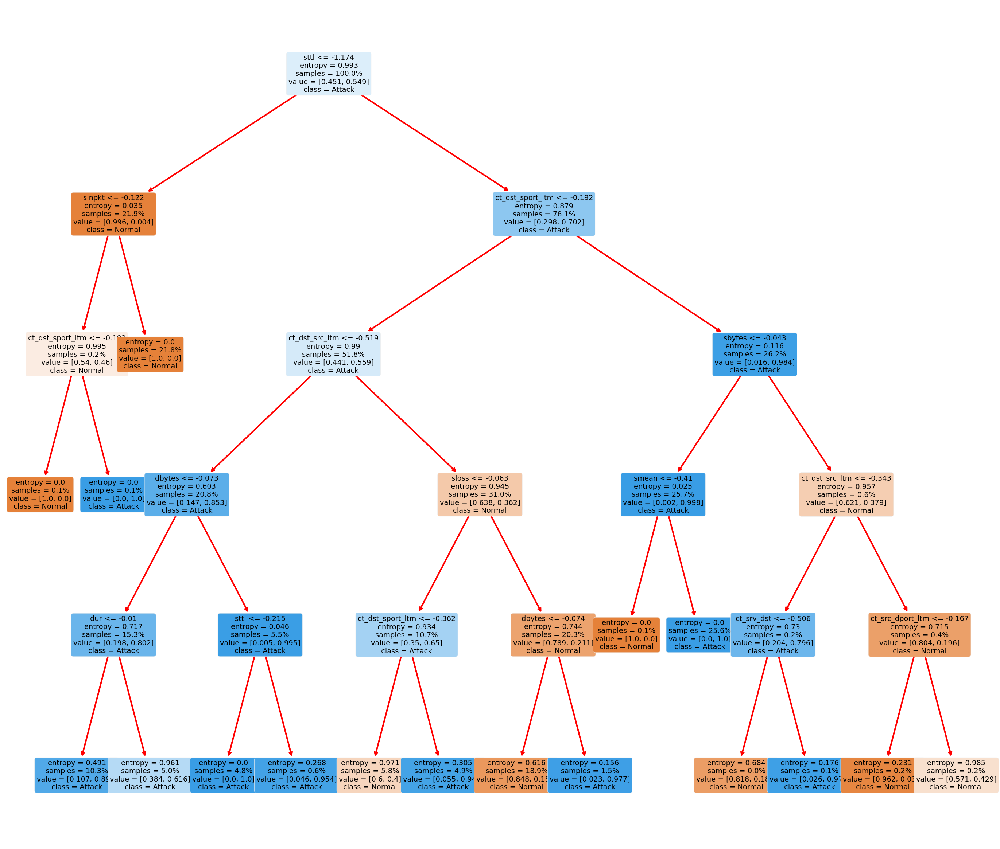

In [ ]:
fig = plt.figure(figsize=(35, 30))
DTtree = tree.plot_tree(DTclf, feature_names = np.array(numerical_cols), class_names = ['Normal', 'Attack'], fontsize=14, proportion=True, filled=True, rounded=True)
for o in DTtree:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('red')
        arrow.set_linewidth(3)

fig.savefig('Decision Tree Classifier XAI Visualization Part 2.png')

In [ ]:
# !pip install tensorflow
# !pip install numpy --upgrade
import eli5 #for purmutation importance
from eli5.sklearn import PermutationImportance
perm = PermutationImportance(DTclf, random_state=1).fit(X_test_transform, y2_test_transform)
eli5.show_weights(perm, feature_names = np.array(numerical_cols))

Weight,Feature
0.2438 ± 0.0041,sttl
0.2308 ± 0.0037,ct_dst_sport_ltm
0.1332 ± 0.0013,sbytes
0.1084 ± 0.0020,ct_dst_src_ltm
0.0387 ± 0.0019,smean
0.0372 ± 0.0018,dbytes
0.0354 ± 0.0023,sloss
0.0006 ± 0.0000,sinpkt
0.0006 ± 0.0003,ct_srv_dst
0 ± 0.0000,djit


#### Let us visualize the first three levels of the decision tree, max_depth=3, 5, 8

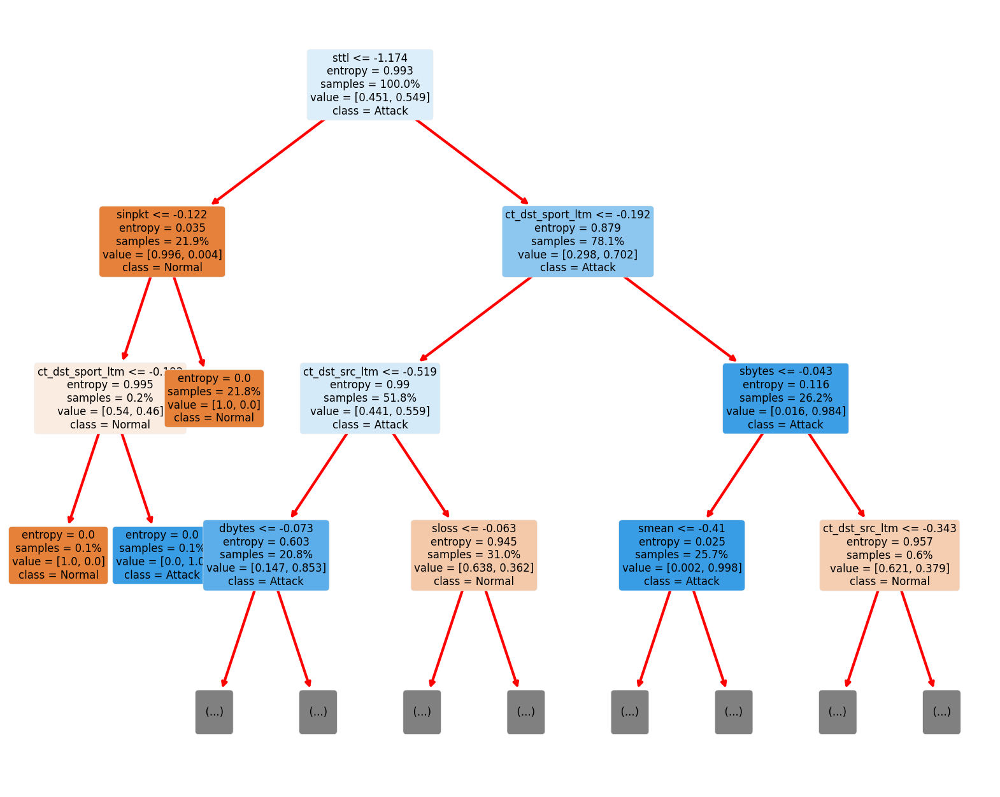

In [ ]:
# visualization of DT Classfier
fig = plt.figure(figsize=(20, 16))
DTtree = tree.plot_tree(DTclf, feature_names = features, class_names = ['Normal', 'Attack'], fontsize=12, proportion=True, filled=True, rounded=True, max_depth=3)
for o in DTtree:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('red')
        arrow.set_linewidth(3)

fig.savefig('Decision Tree Classifier (Depth = 3 Nodes) Explainable AI Visualization.png')

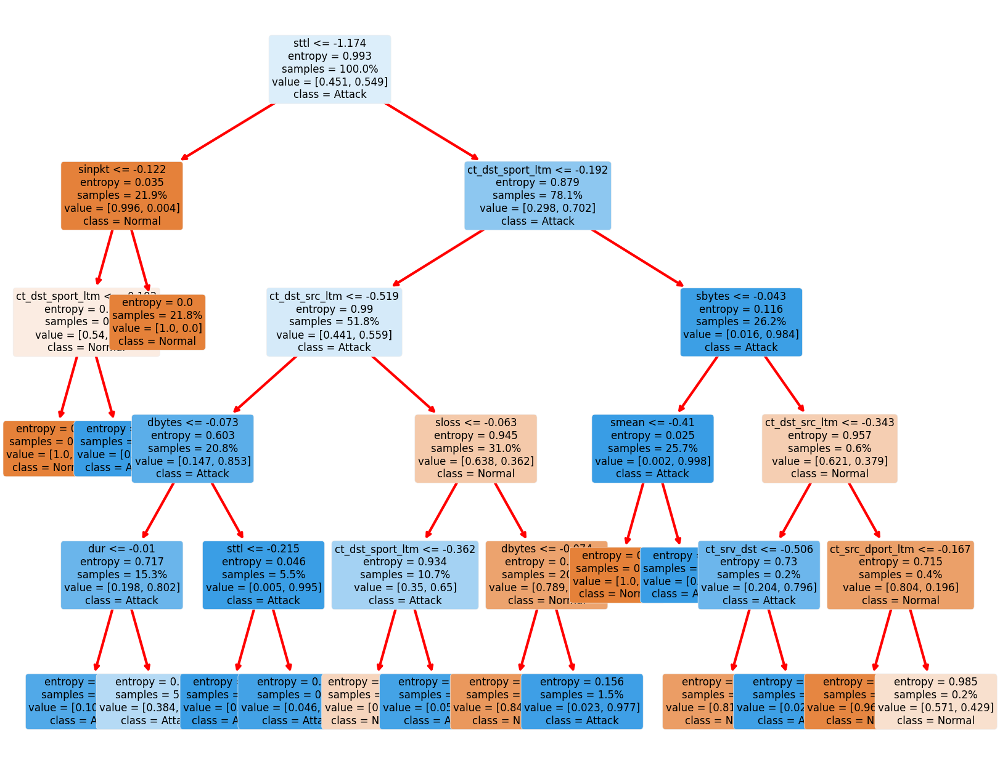

In [ ]:
# visualization of DT Classfier
fig = plt.figure(figsize=(20, 16))
DTtree = tree.plot_tree(DTclf, feature_names = features, class_names = ['Normal', 'Attack'], fontsize=12, proportion=True, filled=True, rounded=True, max_depth=5)
for o in DTtree:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('red')
        arrow.set_linewidth(3)

fig.savefig('Decision Tree Classifier (Depth = 5 Nodes) Explainable AI Visualization.png')

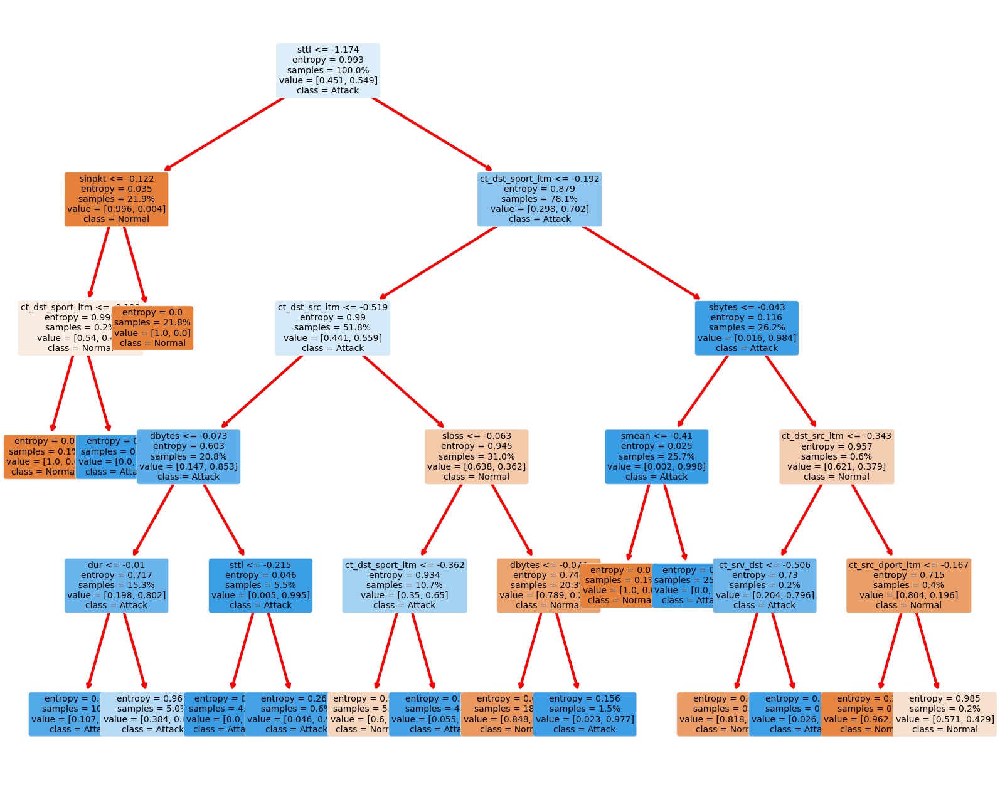

In [ ]:
# visualization of DT Classfier
fig = plt.figure(figsize=(20, 16))
DTtree = tree.plot_tree(DTclf, feature_names = features, class_names = ['Normal', 'Attack'], fontsize=10, proportion=True, filled=True, rounded=True, max_depth=8)
for o in DTtree:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('red')
        arrow.set_linewidth(3)

fig.savefig('Decision Tree Classifier (Depth = 8 Nodes) Explainable AI Visualization.png')

### Model Performance On Testing Set:

In [ ]:
# ===== Step 1: cross-validation ========
# define  Stratified 5-fold cross-validator, it provides train/validate indices to split data in train/validate sets.
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)

DTclf = tree.DecisionTreeClassifier()

# define metrics for evaluating
scoring = ['accuracy', 'precision_micro', 'recall_micro', 'f1_micro', 'roc_auc_ovr']

# perform the 5-fold CV and get the metrics results
cv_results = cross_validate(estimator=DTclf,
                            X=X_train_transform,
                            y=y2_train_transform,
                            scoring=scoring,
                            cv=cv,
                            return_train_score=False) # prevent to show the train scores on cv splits.

In [ ]:
cv_results

{'fit_time': array([0.78130603, 0.85018039, 1.02908492, 1.12000036, 1.08048034]),
 'score_time': array([0.03325129, 0.03980398, 0.0385747 , 0.04016137, 0.03807974]),
 'test_accuracy': array([0.96408432, 0.96252277, 0.96225924, 0.95870206, 0.96043727]),
 'test_precision_micro': array([0.96408432, 0.96252277, 0.96225924, 0.95870206, 0.96043727]),
 'test_recall_micro': array([0.96408432, 0.96252277, 0.96225924, 0.95870206, 0.96043727]),
 'test_f1_micro': array([0.96408432, 0.96252277, 0.96225924, 0.95870206, 0.96043727]),
 'test_roc_auc_ovr': array([0.96379137, 0.96226605, 0.96151249, 0.95840806, 0.96004034])}

The CV results include:

- `test_score`: The score array for test scores on each cv split. Suffix `_score` in `test_score` changes to a specific metric like `test_accuracy` or `test_f1` if there are multiple scoring metrics in the scoring parameter.

- `fit_time`: The time for fitting the estimator on the train set for each cv split.

- `score_time`: The time for scoring the estimator on the test set for each cv split.

**Typically, we will use the mean value of each metric to represent the evaluation results of cross-validation.** For example, we could calculate the mean value of the `accuracy` score:

In [ ]:
cv_results['test_accuracy'].mean()

0.9616011347024747

**In addition, the cross-validation step is used to find the best set of hyperparameters which give the "best" scores of metrics.** Since we do not tune hyperparameters in this case, we then directly fit the DT Classifer by using the default values of hyperparameters and evaluate it on testing data.

In [ ]:
# ======== Step 2: Evaluate the model using testing data =======

# fit the Logistic Regression model
DTclf.fit(X=X_train_transform, y=y2_train_transform)

# predition on testing data
y_pred_class = DTclf.predict(X=X_test_transform)
y_pred_score = DTclf.predict_proba(X=X_test_transform)[:, 1]

# AUC of ROC
auc_ontest = roc_auc_score(y_true=y2_test_transform, y_score=y_pred_score)
# confusion matrix
cm_ontest = confusion_matrix(y_true=y2_test_transform, y_pred=y_pred_class)
# precision score
precision_ontest = precision_score(y_true=y2_test_transform, y_pred=y_pred_class)
# recall score
recall_ontest = recall_score(y_true=y2_test_transform, y_pred=y_pred_class)
# classifition report
cls_report_ontest = classification_report(y_true=y2_test_transform, y_pred=y_pred_class)

# print the above results
print('The model scores {:1.5f} ROC AUC on the test set.'.format(auc_ontest))
print('The precision score on the test set: {:1.5f}'.format(precision_ontest))
print('The recall score on the test set: {:1.5f}'.format(recall_ontest))
print('Confusion Matrix:\n', cm_ontest)
# Print classification report:
print('Classification Report:\n', cls_report_ontest)

The model scores 0.96463 ROC AUC on the test set.
The precision score on the test set: 0.96767
The recall score on the test set: 0.96965
Confusion Matrix:
 [[10549   444]
 [  416 13291]]
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.96      0.96     10993
           1       0.97      0.97      0.97     13707

    accuracy                           0.97     24700
   macro avg       0.96      0.96      0.96     24700
weighted avg       0.97      0.97      0.97     24700



Through the above steps, we could assess if the trained model is good for making predictions on unseen data. Recall that we are training a ML model to classify types of attack behavior on network packets. Considering that we prefer to having a model to capture the cases of attack as many as possible. In other words, the favorable model could have relatively high "coverage" ability and high "precision" ability. **Therefore, we could choose `F1 score` as the evaluation metric in this case. `F1 score` can be interpreted as a weighted average of the precision and recall, where an F1 score reaches its best value at 1 and worst score at 0.**

###### Exapand DT Classfier to RT Classfier to show XAI also

## Explainable AI (XAI) with a MLP (Multi-Layer Perceptron)

Lime: Explaining the predictions of any machine learning classifier

In [ ]:
!pip install lime
import sklearn
import sklearn.datasets
import sklearn.ensemble
import numpy as np
import lime
import lime.lime_tabular
from __future__ import print_function
np.random.seed(1)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=5b923a6461b6ce133cabf596767eb33723909cebb25bae4e37255bec8a52bde0
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
MLP = MLPClassifier(random_state=123, solver='adam', max_iter=8000)
MLP.fit(X_train_transform, y2_train_transform)

MLPClassifier(max_iter=8000, random_state=123)

#### Explaining predictions

In [ ]:
metrics.accuracy_score(y2_test_transform, MLP.predict(X_test_transform))

0.9639271255060728

In [ ]:
predict_fn = lambda x: MLP.predict_proba(x).astype(float)

In [ ]:
features = np.array(numerical_cols)
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_transform ,feature_names = features, class_names = ['Normal', 'Attack'], kernel_width=3)

In [ ]:
np.random.seed(1)
i = 1653
# print(X_test_transform[i])
exp = explainer.explain_instance(X_test_transform[i], predict_fn, num_features=10)
exp.show_in_notebook(show_all=False)
print('True class: ')
if (y2_test_transform[i] == 0):
    print('Normal')
else:
    print('Attack')

True class: 
Normal


## Explainable AI (XAI) with XGBoost

###### XGBoost is an optimized distributed gradient boosting library designed to be highly efficient, flexible and portable. As it uses Gradient Boosting and can be parallelized, this algorithm is very popular in data science and is frequently used for regression and classification tasks. The following example shows a simple regression model and is hopefully a good entry point for anyone wanting to create and use XGBoost based models.

###### In an era of AI and ethics, explainability is one of the important recent topics in machine learning and data science. Let’s say you have built a machine learning model that performs well on your training and test data: how do you find out which samples and features offer the highest impact on your model’s output? This is where a library like SHAP can provide you with very valuable insights. SHAP (SHapley Additive exPlanations) is a game-theoretic approach to explaining the output of any machine learning model. The following example shows how an XGBoost-based classifier model can be analyzed with SHAP to help better understand the impact of features on the model output. The chart on the top-right provides a view on the distribution of feature values and their impact on the model.

###### SHAP summary shows top feature contributions. It also shows data point distribution and provides visual indicators of how feature values affect predictions. Here red indicates higher feature value, blue indicates lower feature value. On the x-axis, higher SHAP value to the right corresponds to higher prediction value (more likely listing gets booked), lower SHAP value to the left corresponds to lower prediction value (less likely listing gets booked).

#### Gradient boosting machine methods such as XGBoost are state-of-the-art for these types of prediction problems with tabular style input data of many modalities. Tree SHAP (arXiv paper) allows for the exact computation of SHAP values for tree ensemble methods, and has been integrated directly into the C++ XGBoost code base. This allows fast exact computation of SHAP values without sampling and without providing a background dataset (since the background is inferred from the coverage of the trees).

#### Here we demonstrate how to use SHAP values to understand XGBoost model predictions.

In [ ]:
!pip install xgboost

In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 6.6 MB/s eta 0:00:00


In [ ]:
from sklearn.model_selection import train_test_split
import xgboost
import shap
import numpy as np
import matplotlib.pylab as pl

##### Load Dataset

In [ ]:
xg_train = xgboost.DMatrix(X_train_transform, label=y2_train_transform)
xg_test = xgboost.DMatrix(X_test_transform, label=y2_test_transform)

##### Train Model

In [ ]:
params = {
    "eta": 0.01,
    "objective": "binary:logistic",
    "subsample": 0.5,
    "base_score": np.mean(y2_train_transform),
    "eval_metric": "logloss"
}
model = xgboost.train(params, xg_train, 5000, evals = [(xg_test, "test")], verbose_eval=100, early_stopping_rounds=20)

[0]	test-logloss:0.67943
[100]	test-logloss:0.29786
[200]	test-logloss:0.18663
[300]	test-logloss:0.14184
[400]	test-logloss:0.11811
[500]	test-logloss:0.10277
[600]	test-logloss:0.09167
[700]	test-logloss:0.08400
[800]	test-logloss:0.07838
[900]	test-logloss:0.07452
[1000]	test-logloss:0.07128
[1100]	test-logloss:0.06889
[1200]	test-logloss:0.06694
[1300]	test-logloss:0.06544
[1400]	test-logloss:0.06418
[1500]	test-logloss:0.06318
[1600]	test-logloss:0.06219
[1700]	test-logloss:0.06134
[1800]	test-logloss:0.06066
[1900]	test-logloss:0.05999
[2000]	test-logloss:0.05939
[2100]	test-logloss:0.05882
[2200]	test-logloss:0.05829
[2300]	test-logloss:0.05789
[2400]	test-logloss:0.05750
[2500]	test-logloss:0.05703
[2600]	test-logloss:0.05669
[2700]	test-logloss:0.05632
[2800]	test-logloss:0.05608
[2900]	test-logloss:0.05579
[3000]	test-logloss:0.05559
[3100]	test-logloss:0.05538
[3200]	test-logloss:0.05511
[3300]	test-logloss:0.05488
[3400]	test-logloss:0.05472
[3500]	test-logloss:0.05452
[360

###### Explain predictions: Here we use the Tree SHAP implementation integrated into XGBoost to explain the testing dataset

In [ ]:
# this takes a minute or two since we are explaining over 30 thousand samples in a model with over a thousand trees
explainer = shap.TreeExplainer(model)
shap_values_test = explainer.shap_values(X_test)

[09:00:11] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


##### Visualize a single prediction

In [ ]:
# print the JS visualization code to the notebook
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values_test[5,:], X_test.iloc[5,:])

In [ ]:
y2_test[5]

1

###### Visualize many predictions

In [ ]:
shap.force_plot(explainer.expected_value, shap_values_test[:1000,:], X_test.iloc[:1000,:])

###### Bar chart of mean importance

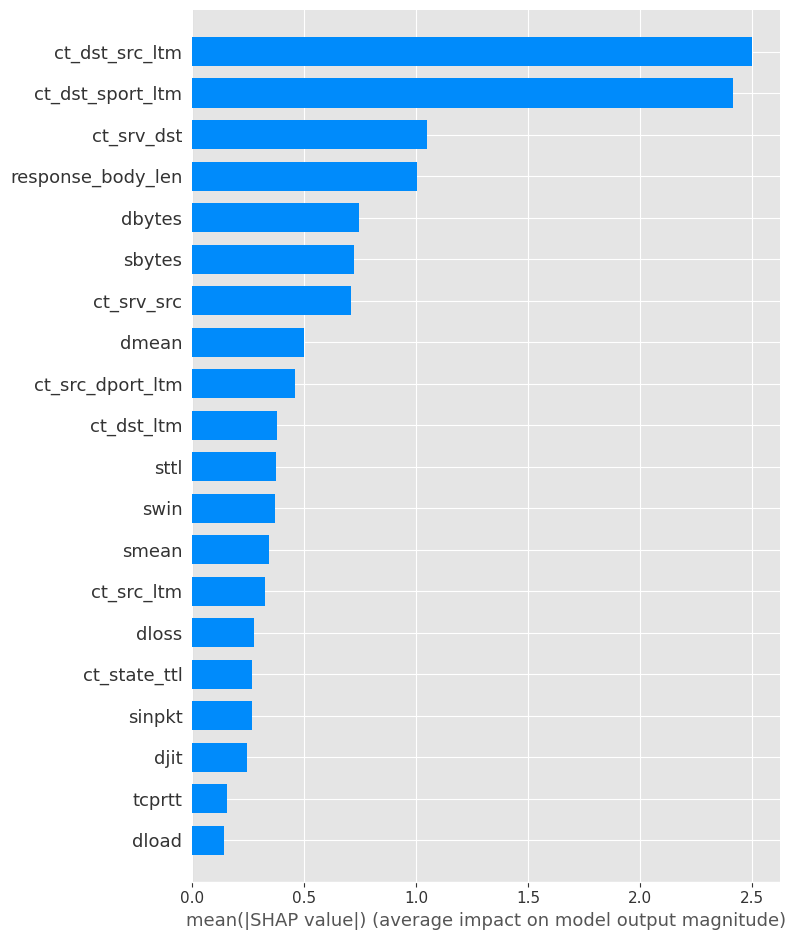

In [ ]:
shap.summary_plot(shap_values_test, X_test, plot_type="bar")

SHAP Summary Plot:
Rather than use a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. It is interesting to note that the relationship feature has more total model impact than the captial gain feature, but for those samples where capital gain matters it has more impact than age. In other words, capital gain effects a few predictions by a large amount, while age effects all predictions by a smaller amount.

Note that when the scatter points don't fit on a line they pile up to show density, and the color of each point represents the feature value of that individual.

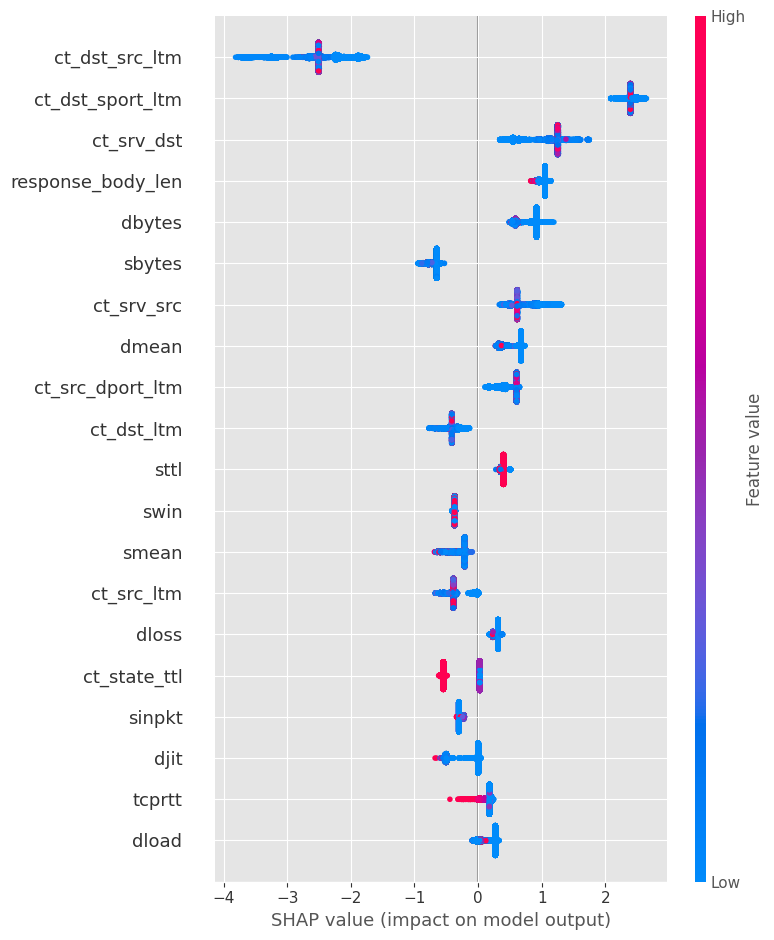

In [ ]:
shap.summary_plot(shap_values_test, X_test)

###### SHAP Dependence Plots
SHAP dependence plots show the effect of a single feature across the whole dataset. They plot a feature's value vs. the SHAP value of that feature across many samples. SHAP dependence plots are similar to partial dependence plots, but account for the interaction effects present in the features, and are only defined in regions of the input space supported by data. The vertical dispersion of SHAP values at a single feature value is driven by interaction effects, and another feature is chosen for coloring to highlight possible interactions.

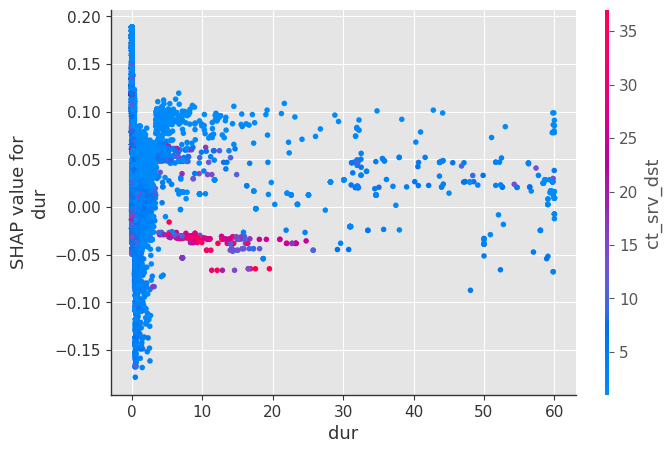

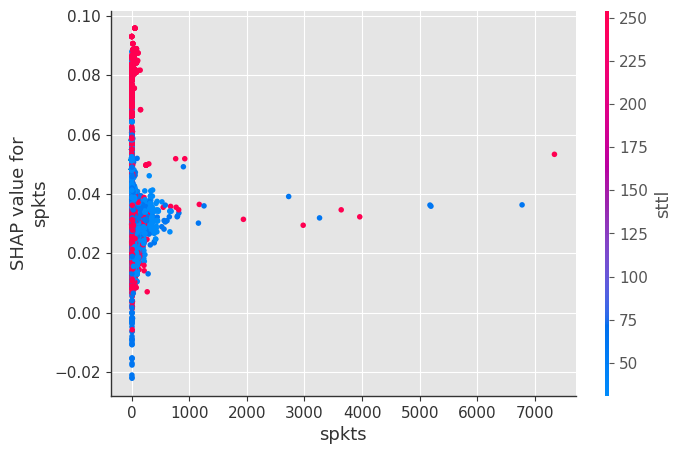

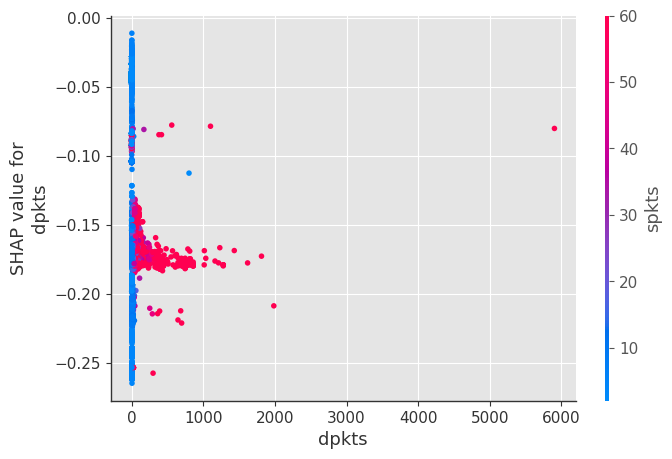

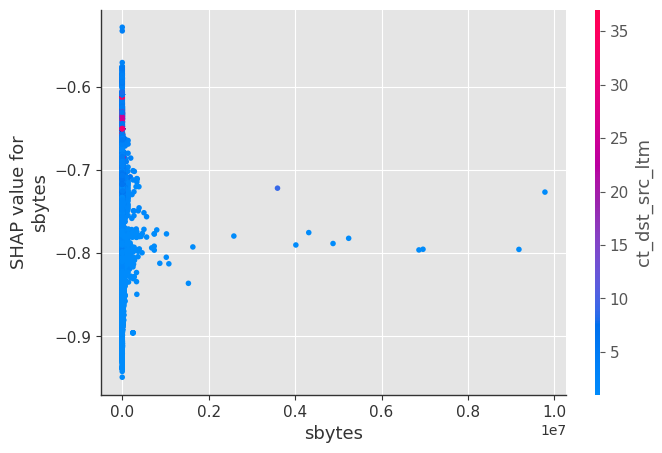

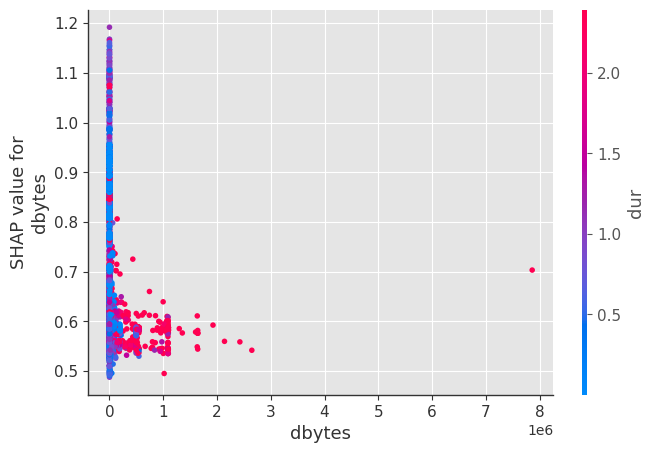

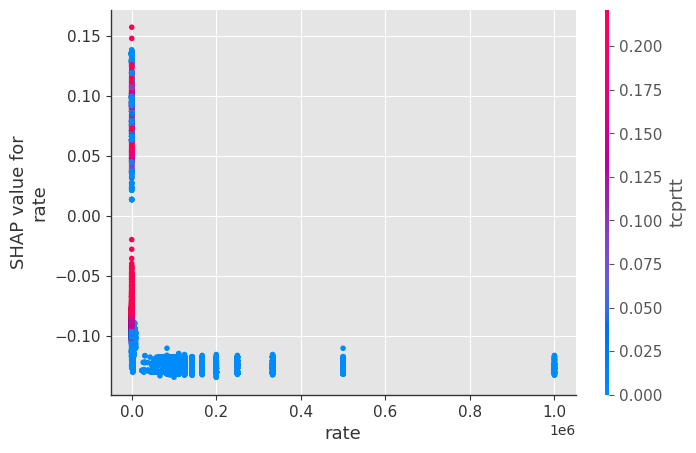

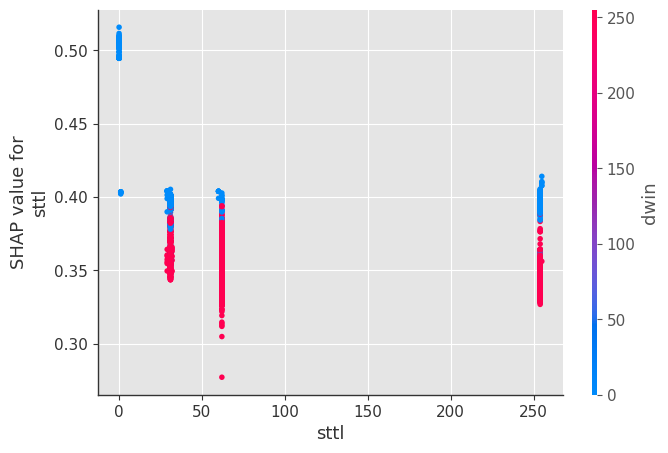

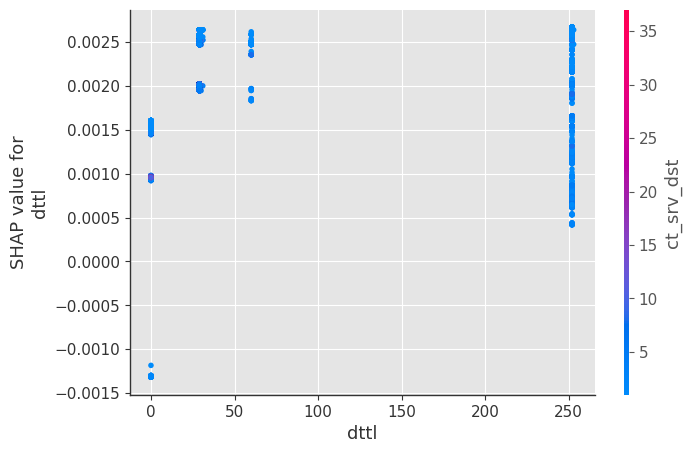

invalid value encountered in divide
invalid value encountered in divide


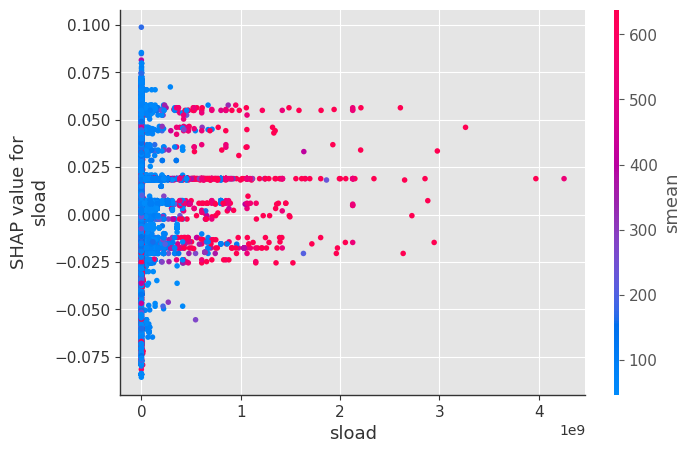

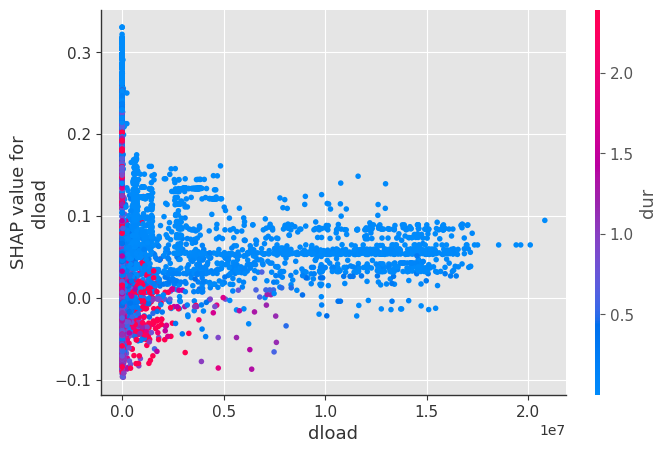

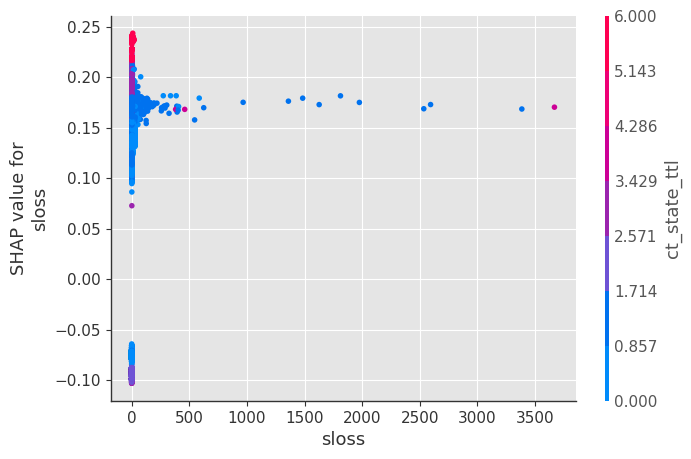

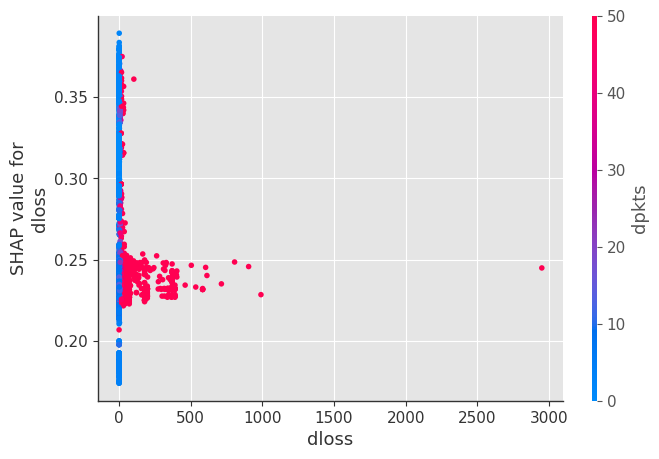

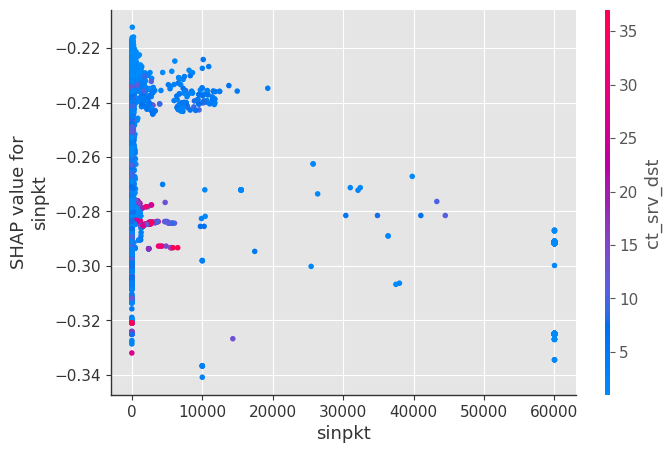

...

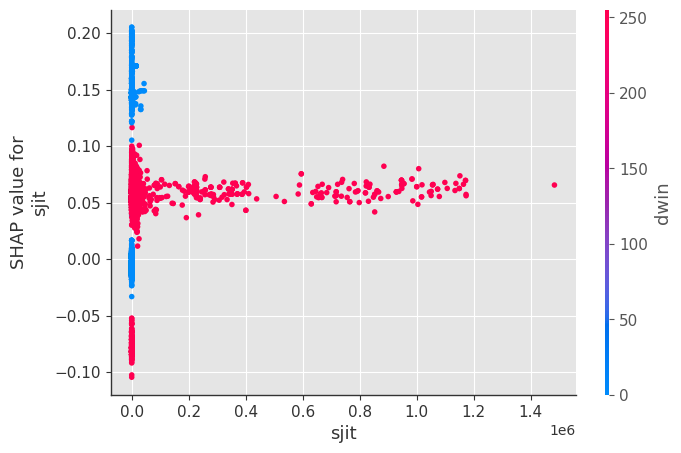

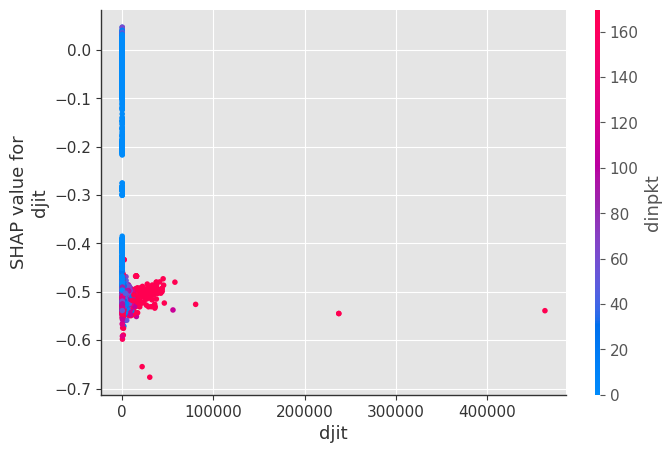

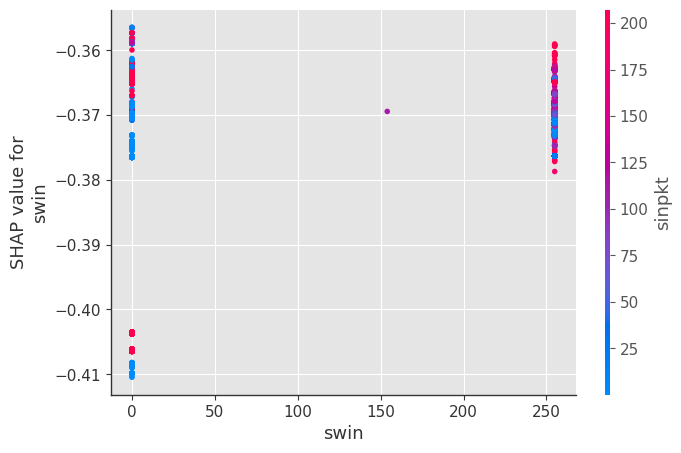

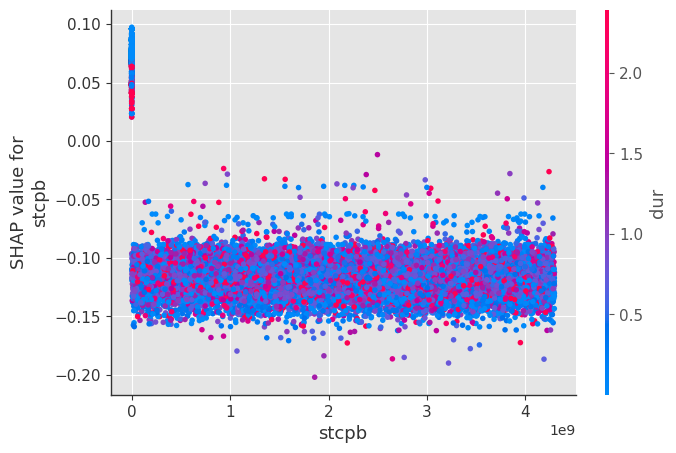

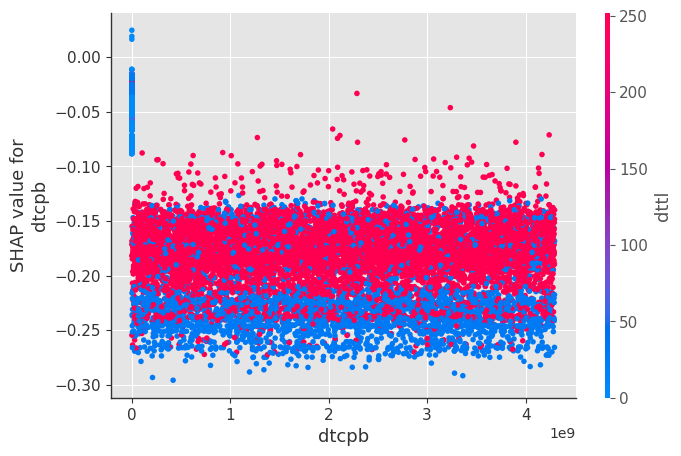

invalid value encountered in divide
invalid value encountered in divide


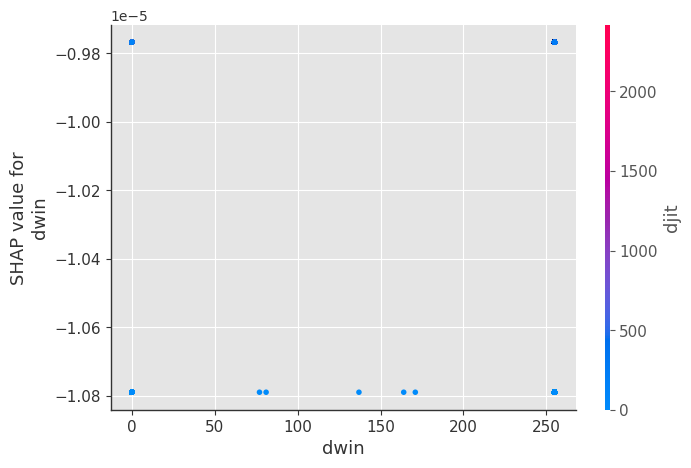

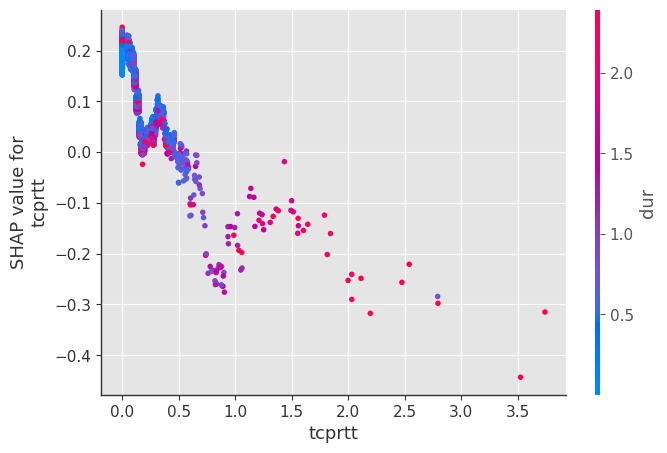

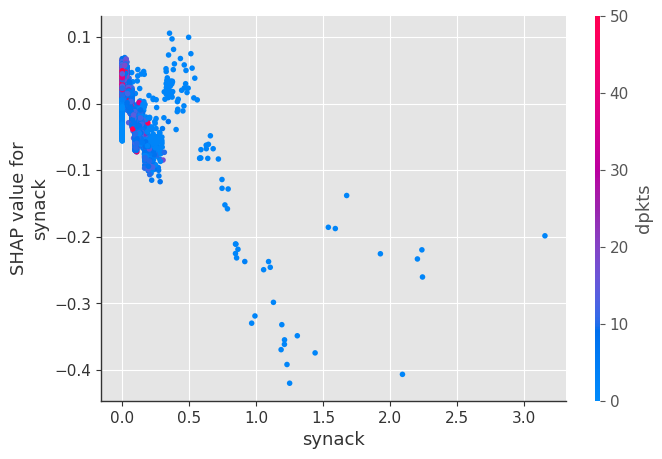

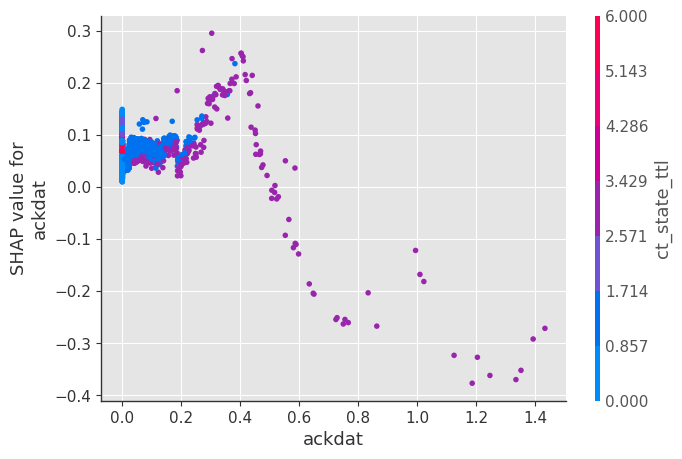

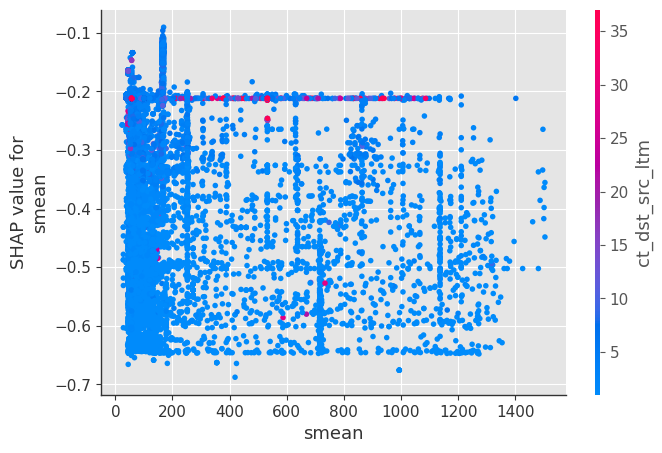

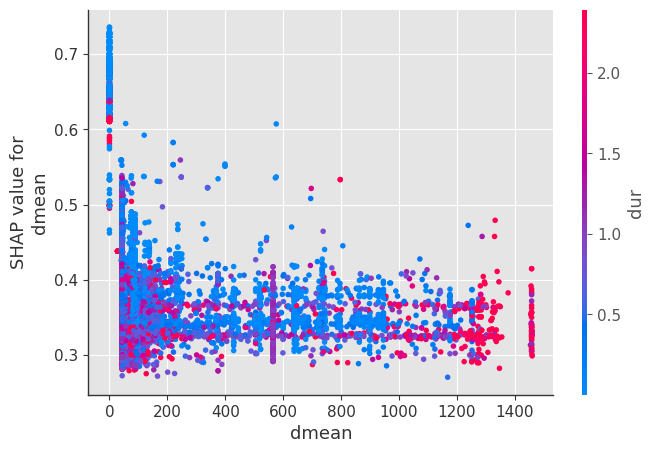

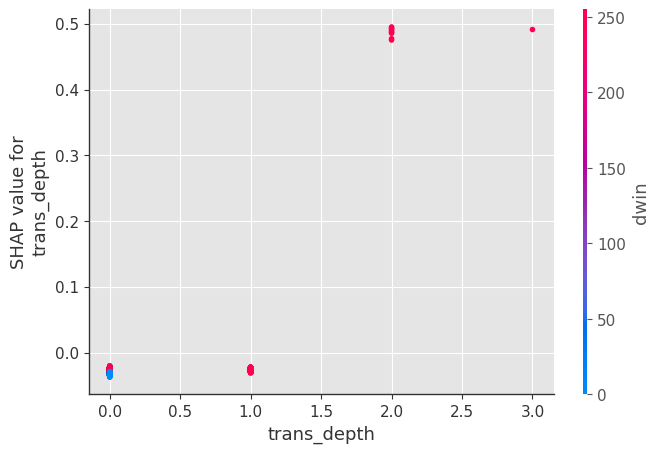

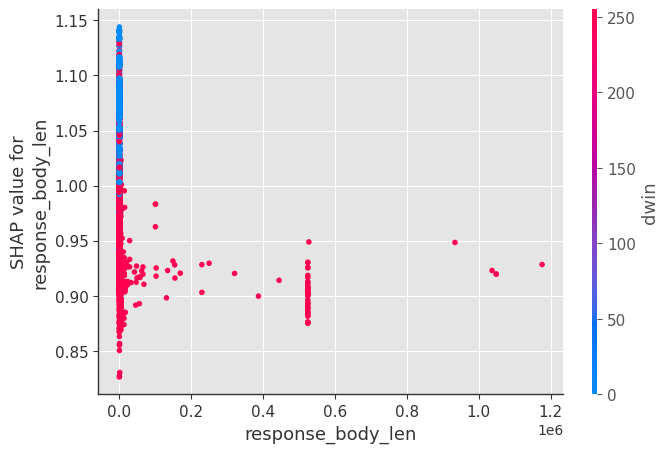

invalid value encountered in divide
invalid value encountered in divide


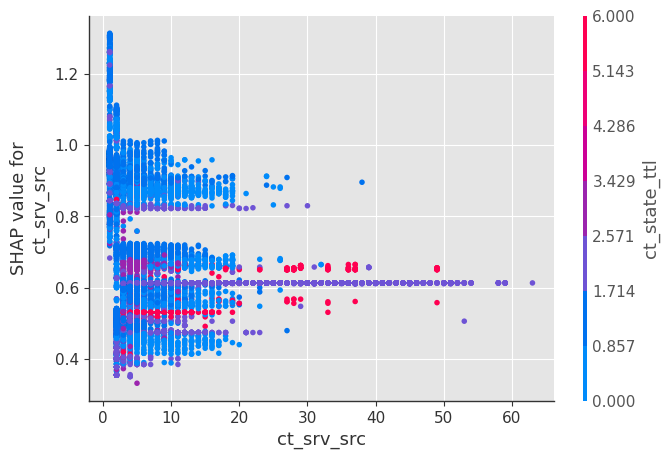

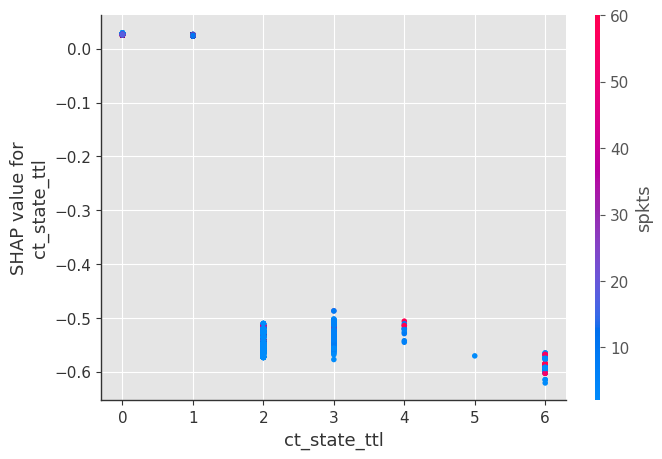

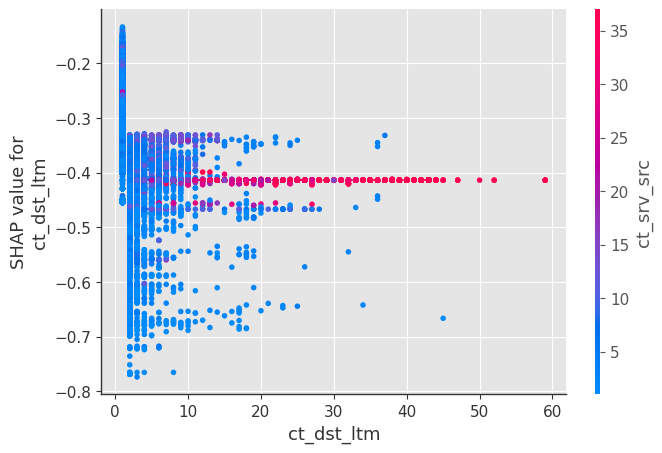

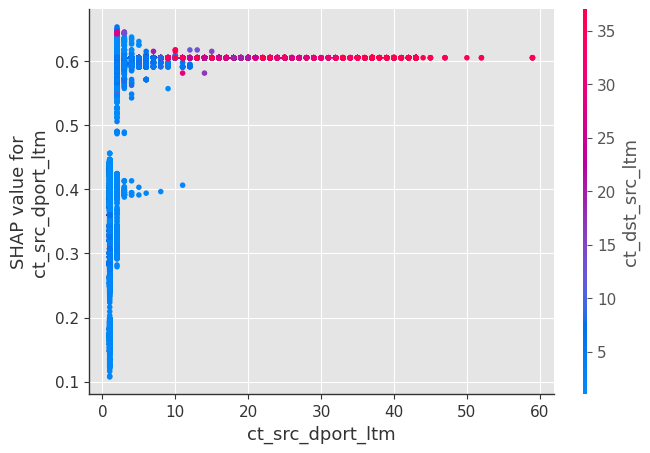

invalid value encountered in divide
invalid value encountered in divide


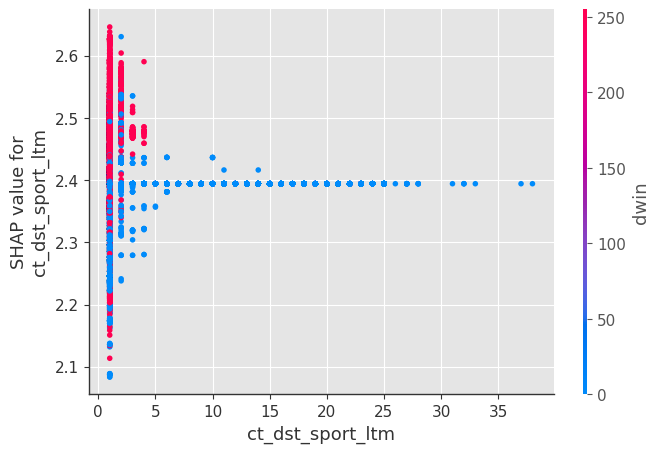

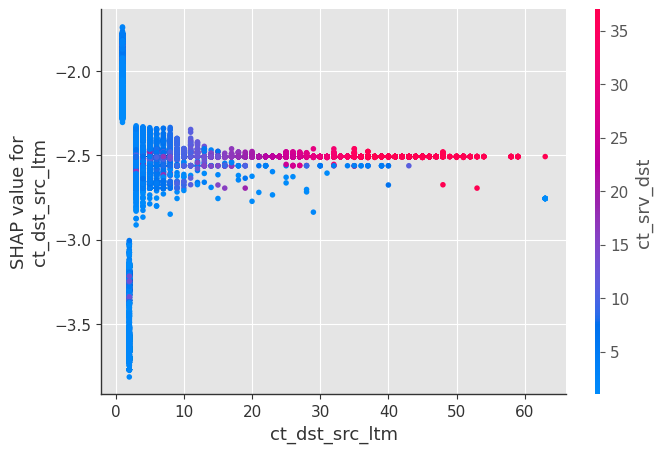

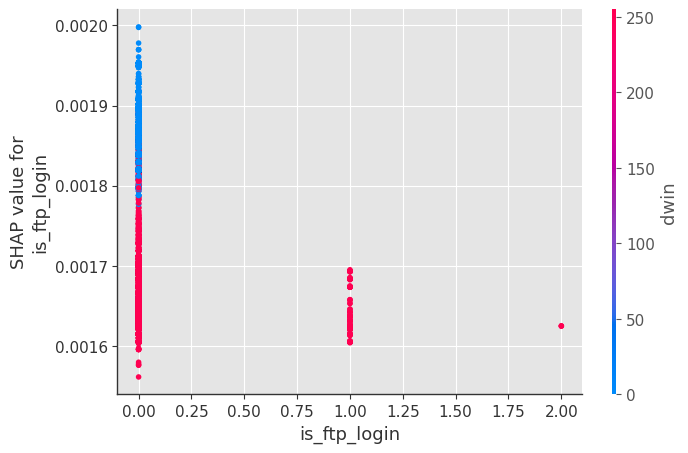

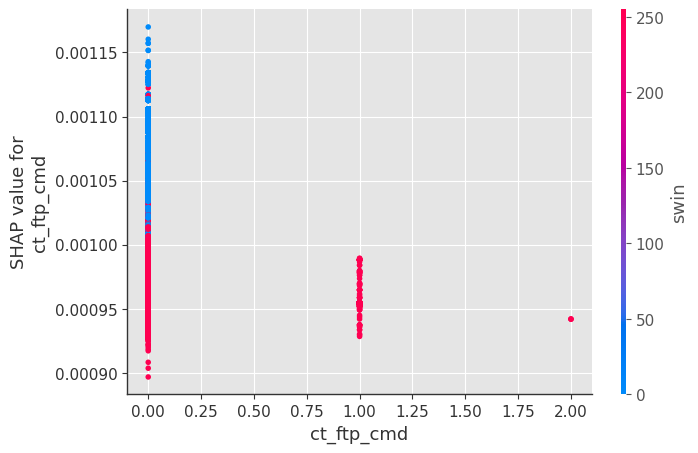

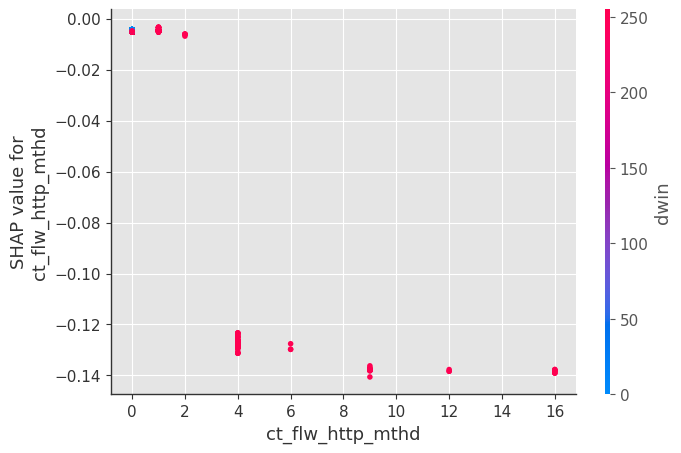

invalid value encountered in divide
invalid value encountered in divide


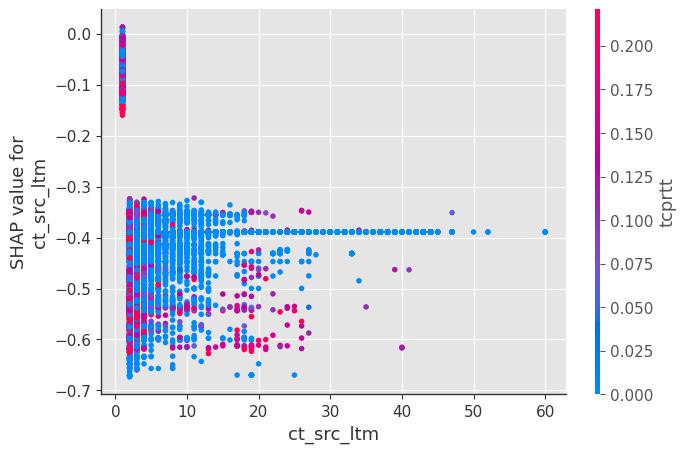

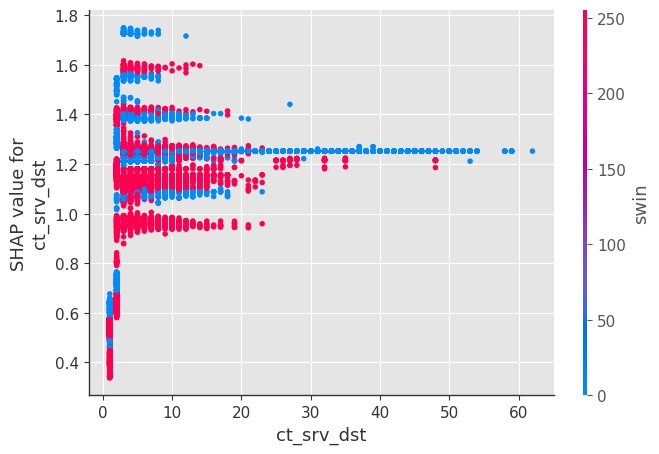

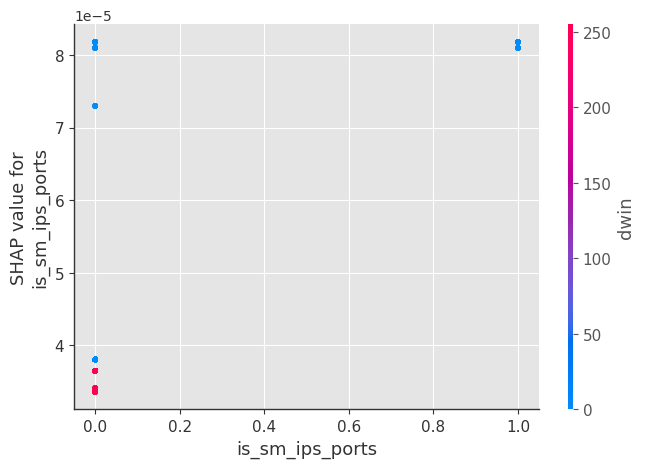

In [ ]:
for name in X_test.columns:
    shap.dependence_plot(name, shap_values_test, X_test, display_features=X_test)

###### Compute SHAP Interaction Values

See the Tree SHAP paper for more details, but briefly, SHAP interaction values are a generalization of SHAP values to higher order interactions. Fast exact computation of pairwise interactions are implemented in the latest version of XGBoost with the pred_interactions flag. With this flag XGBoost returns a matrix for every prediction, where the main effects are on the diagonal and the interaction effects are off-diagonal. The main effects are similar to the SHAP values you would get for a linear model, and the interaction effects captures all the higher-order interactions are divide them up among the pairwise interaction terms. Note that the sum of the entire interaction matrix is the difference between the model's current output and expected output, and so the interaction effects on the off-diagonal are split in half (since there are two of each). When plotting interaction effects the SHAP package automatically multiplies the off-diagonal values by two to get the full interaction effect.

In [ ]:
# takes a couple minutes since SHAP interaction values take a factor of 2 * # features
# more time than SHAP values to compute, since this is just an example we only explain
# the first 2,000 people in order to run quicker
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(X_test.iloc[:2000,:])

[09:19:24] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


###### SHAP Interaction Value Summary Plot
A summary plot of a SHAP interaction value matrix plots a matrix of summary plots with the main effects on the diagonal and the interaction effects off the diagonal.

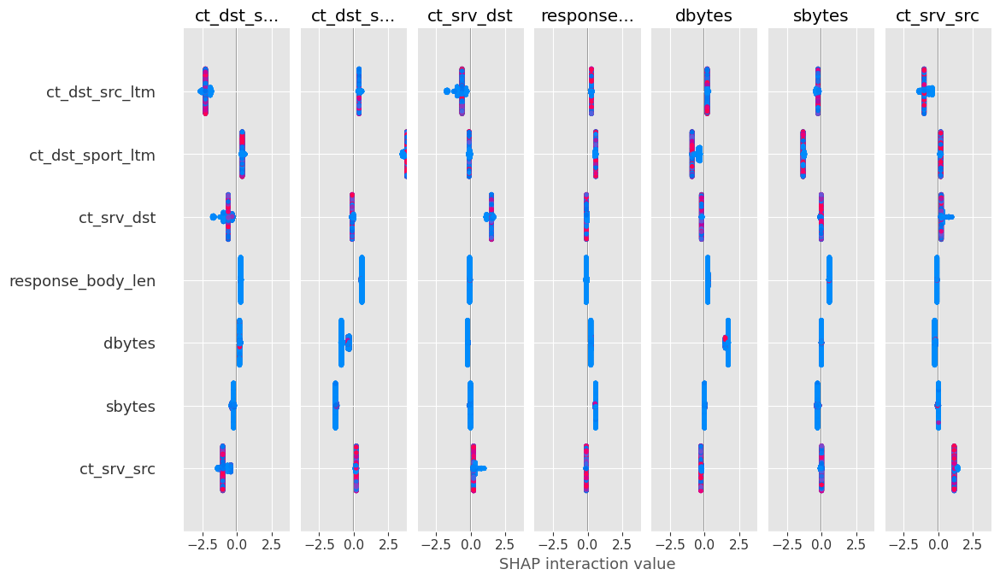

In [ ]:
shap.summary_plot(shap_interaction_values, X_test.iloc[:2000,:])

# USING LIME PACKAGE

In [ ]:
!pip install lime

In [ ]:
import sklearn
import sklearn.datasets
import sklearn.ensemble
import numpy as np
import lime
import lime.lime_tabular
from __future__ import print_function
np.random.seed(1)

In [ ]:
import xgboost
gbtree = xgboost.XGBClassifier(n_estimators=300, max_depth=5)
gbtree.fit(X_train_transform, y2_train_transform)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [ ]:
metrics.accuracy_score(y2_test_transform, gbtree.predict(X_test_transform))

0.979838056680162

In [ ]:
predict_fn = lambda x: gbtree.predict_proba(x).astype(float)

#### Explaining predictions

In [ ]:
features = np.array(numerical_cols)
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_transform ,feature_names = features, class_names = ['Normal', 'Attack'], kernel_width=3)

These are just a mix of the continuous and categorical examples we showed before. For categorical features, the feature contribution is always the same as the linear model weight.

In [ ]:
np.random.seed(1)
i = 1653
exp = explainer.explain_instance(X_test_transform[i], predict_fn, num_features=5)
exp.show_in_notebook(show_all=False)

In [ ]:
i = 10
exp = explainer.explain_instance(X_test_transform[i], predict_fn, num_features=5)
exp.show_in_notebook(show_all=False)